In [ ]:
!pip install timm
!pip install natsort
!pip install transformers
!pip install wfdb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.4/42.4 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 57.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 160.0/160.0 kB 6.8 MB/s eta 0:00:00


In [ ]:
# Importing libraries
import torch
from torch.utils.data import DataLoader, Dataset
import torch.nn.functional as F
import torch.nn as nn
from tqdm import tqdm
from natsort import natsorted
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from scipy.optimize import linear_sum_assignment as linear_assignment
import matplotlib
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from matplotlib import style
import timm
from transformers import DistilBertModel, DistilBertConfig

In [ ]:
import torch
from torch import nn

from einops import rearrange
from einops.layers.torch import Rearrange

def pair(t):
    return t if isinstance(t, tuple) else (t, t)

def posemb_sincos_2d(patches, temperature = 10000, dtype = torch.float32):
    _, h, w, dim, device, dtype = *patches.shape, patches.device, patches.dtype

    y, x = torch.meshgrid(torch.arange(h, device = device), torch.arange(w, device = device))
    assert (dim % 4) == 0, 'feature dimension must be multiple of 4 for sincos emb'
    omega = torch.arange(dim // 4, device = device) / (dim // 4 - 1)
    omega = 1. / (temperature ** omega)

    y = y.flatten()[:, None] * omega[None, :]
    x = x.flatten()[:, None] * omega[None, :]
    pe = torch.cat((x.sin(), x.cos(), y.sin(), y.cos()), dim = 1)
    return pe.type(dtype)

# patch dropout

class PatchDropout(nn.Module):
    def __init__(self, prob):
        super().__init__()
        assert 0 <= prob < 1.
        self.prob = prob

    def forward(self, x):
        if not self.training or self.prob == 0.:
            return x

        b, n, _, device = *x.shape, x.device

        batch_indices = torch.arange(b, device = device)
        batch_indices = rearrange(batch_indices, '... -> ... 1')
        num_patches_keep = max(1, int(n * (1 - self.prob)))
        patch_indices_keep = torch.randn(b, n, device = device).topk(num_patches_keep, dim = -1).indices

        return x[batch_indices, patch_indices_keep]

# classes

class FeedForward(nn.Module):
    def __init__(self, dim, hidden_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.LayerNorm(dim),
            nn.Linear(dim, hidden_dim),
            nn.GELU(),
            nn.Linear(hidden_dim, dim),
        )
    def forward(self, x):
        return self.net(x)

class Attention(nn.Module):
    def __init__(self, dim, heads = 8, dim_head = 64):
        super().__init__()
        inner_dim = dim_head *  heads
        self.heads = heads
        self.scale = dim_head ** -0.5
        self.norm = nn.LayerNorm(dim)

        self.attend = nn.Softmax(dim = -1)

        self.to_qkv = nn.Linear(dim, inner_dim * 3, bias = False)
        self.to_out = nn.Linear(inner_dim, dim, bias = False)

    def forward(self, x):
        x = self.norm(x)

        qkv = self.to_qkv(x).chunk(3, dim = -1)
        q, k, v = map(lambda t: rearrange(t, 'b n (h d) -> b h n d', h = self.heads), qkv)

        dots = torch.matmul(q, k.transpose(-1, -2)) * self.scale

        attn = self.attend(dots)

        out = torch.matmul(attn, v)
        out = rearrange(out, 'b h n d -> b n (h d)')
        return self.to_out(out)

class Transformer(nn.Module):
    def __init__(self, dim, depth, heads, dim_head, mlp_dim):
        super().__init__()
        self.norm = nn.LayerNorm(dim)
        self.layers = nn.ModuleList([])
        for _ in range(depth):
            self.layers.append(nn.ModuleList([
                Attention(dim, heads = heads, dim_head = dim_head),
                FeedForward(dim, mlp_dim)
            ]))
    def forward(self, x):
        for attn, ff in self.layers:
            x = attn(x) + x
            x = ff(x) + x
        return self.norm(x)

class SimpleViT(nn.Module):
    def __init__(self, *, image_size, patch_size, num_classes, dim, depth, heads, mlp_dim, channels = 3, dim_head = 64, patch_dropout = 0.5):
        super().__init__()
        image_height, image_width = pair(image_size)
        patch_height, patch_width = pair(patch_size)

        assert image_height % patch_height == 0 and image_width % patch_width == 0, 'Image dimensions must be divisible by the patch size.'

        num_patches = (image_height // patch_height) * (image_width // patch_width)
        patch_dim = channels * patch_height * patch_width

        self.to_patch_embedding = nn.Sequential(
            Rearrange('b c (h p1) (w p2) -> b h w (p1 p2 c)', p1 = patch_height, p2 = patch_width),
            nn.LayerNorm(patch_dim),
            nn.Linear(patch_dim, dim),
            nn.LayerNorm(dim)
        )

        self.patch_dropout = PatchDropout(patch_dropout)

        self.transformer = Transformer(dim, depth, heads, dim_head, mlp_dim)

        self.to_latent = nn.Identity()
        self.linear_head = nn.Linear(dim, num_classes)
        self.sigmoid = nn.Sigmoid()


    def forward(self, img):
        *_, h, w, dtype = *img.shape, img.dtype

        x = self.to_patch_embedding(img)
        pe = posemb_sincos_2d(x)
        x = rearrange(x, 'b ... d -> b (...) d') + pe

        x = self.patch_dropout(x)

        x = self.transformer(x)
        x = x.mean(dim = 1)

        x = self.to_latent(x)
        #x = self.linear_head(x)
        return x



In [ ]:
class ECGEncoder(nn.Module):
      def __init__(self, model=None, pretrained=True, trainable=True):
          super().__init__()
          model = SimpleViT(image_size=(12, 5000), patch_size=(1, 500), num_classes=5, dim=512, depth=3, heads=6, mlp_dim=256, channels=1, dim_head=64)
          self.model = model

      def forward(self, x):
          return self.model(x)


class CaptionEncoder(nn.Module):
    def __init__(self, model_name="distilbert-base-uncased", pretrained=True, trainable=True):
        super().__init__()
        if pretrained:
            self.model = DistilBertModel.from_pretrained(model_name)
        else:
            self.model = DistilBertModel(config=DistilBertConfig())

        for p in self.model.parameters():
            p.requires_grad = trainable

        # we are using the CLS token hidden representation as the sentence's embedding
        self.target_token_idx = 0

    def forward(self, input_ids, attention_mask):
        output = self.model(input_ids=input_ids, attention_mask=attention_mask)
        last_hidden_state = output.last_hidden_state
        return last_hidden_state[:, self.target_token_idx, :]



class ProjectionHead(nn.Module):
    def __init__(
        self,
        embedding_dim=256,
        projection_dim=128,
        dropout=.1
    ):
        super().__init__()
        self.projection = nn.Linear(embedding_dim, projection_dim)
        self.gelu = nn.GELU()
        self.fc = nn.Linear(projection_dim, projection_dim)
        self.dropout = nn.Dropout(dropout)
        self.layer_norm = nn.LayerNorm(projection_dim)

    def forward(self, x):
        projected = self.projection(x)
        x = self.gelu(projected)
        x = self.fc(x)
        x = self.dropout(x)
        x = x + projected
        x = self.layer_norm(x)
        return x



class CLIPModel(nn.Module):
    def __init__(
        self,
        temperature=1,
        image_embedding=512,
        text_embedding=768,
        image_encoder=None,
        text_encoder=None,
        image_projection=None,
        text_projection=None,
    ):
        super().__init__()
        self.image_encoder = ECGEncoder()
        self.text_encoder = CaptionEncoder()
        self.image_projection = ProjectionHead(embedding_dim=image_embedding)
        self.text_projection = ProjectionHead(embedding_dim=text_embedding)
        self.temperature = temperature

    def forward(self, batch):
        # Getting Image and Text Features
        image_features = self.image_encoder(batch["image"])
        text_features = self.text_encoder(
            input_ids=batch["input_ids"], attention_mask=batch["attention_mask"]
        )
        # Getting Image and Text Embeddings (with same dimension)
        image_embeddings = self.image_projection(image_features)
        text_embeddings = self.text_projection(text_features)

        # Calculating the Loss
        logits = (text_embeddings @ image_embeddings.T) / self.temperature
        images_similarity = image_embeddings @ image_embeddings.T
        texts_similarity = text_embeddings @ text_embeddings.T
        targets = F.softmax(
            (images_similarity + texts_similarity) / 2 * self.temperature, dim=-1
        )
        texts_loss = cross_entropy(logits, targets, reduction='none')
        images_loss = cross_entropy(logits.T, targets.T, reduction='none')
        loss =  (images_loss + texts_loss) / 2.0 # shape: (batch_size)
        return loss.mean()


def cross_entropy(preds, targets, reduction='none'):
    log_softmax = nn.LogSoftmax(dim=-1)
    loss = (-targets * log_softmax(preds)).sum(1)
    if reduction == "none":
        return loss
    elif reduction == "mean":
        return loss.mean()

if __name__ == '__main__':
    images = torch.randn(8, 1, 12, 1000)
    input_ids = torch.randint(5, 300, size=(8, 25))
    attention_mask = torch.ones(8, 25)
    batch = {
        'image': images,
        'input_ids': input_ids,
        'attention_mask': attention_mask
    }

    CLIP = CLIPModel()
    loss = CLIP(batch)
    print(loss)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/torch/functional.py:513: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3609.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


tensor(5.2627, grad_fn=<MeanBackward0>)


In [ ]:
class AvgMeter:
    def __init__(self, name="Metric"):
        self.name = name
        self.reset()

    def reset(self):
        self.avg, self.sum, self.count = [0] * 3

    def update(self, val, count=1):
        self.count += count
        self.sum += val * count
        self.avg = self.sum / self.count

    def __repr__(self):
        text = f"{self.name}: {self.avg:.4f}"
        return text

def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group["lr"]

In [ ]:


import os
import glob
import json
import random
import subprocess
import shutil
from pprint import pprint
import matplotlib.pyplot as plt

import numpy as np
import wfdb

lead_names = ["I", "II", "III", "aVR", "aVL", "aVF", "V1", "V2", "V3", "V4", "V5", "V6"]
hz = 500
start_time = 0
time = 10
start_length = int(start_time * hz)
sample_length = int(time * hz)
end_time = start_time + time
t = np.arange(start_time, end_time, 1 / hz)

def draw_ecg(ecg, lead=1):
    plt.plot(
        t,
        ecg[lead][start_length: start_length + sample_length],
        linewidth=2,
        color="k",
        alpha=1.0,
        label=lead_names[lead]
    )
    minimum = min(ecg[lead])
    maximum = max(ecg[lead])
    ylims_candidates = [-2.5, -2.0, -1.5, -1.0, -0.5, 0, 0.5, 1.0 , 1.5, 2.0, 2.5]

    ylims = (
        max([x for x in ylims_candidates if x <= minimum]),
        min([x for x in ylims_candidates if x >= maximum]),
    )
    plt.vlines(np.arange(start_time, end_time, 0.2), ylims[0], ylims[1], colors="r", alpha=1.0)
    plt.vlines(np.arange(start_time, end_time, 0.04), ylims[0], ylims[1], colors="r", alpha=0.3)
    plt.hlines(np.arange(ylims[0], ylims[1], 0.5), start_time, end_time, colors="r", alpha=1.0)
    plt.hlines(np.arange(ylims[0], ylims[1], 0.1), start_time, end_time, colors="r", alpha=0.3)

    plt.xticks(np.arange(start_time, end_time + 1, 1.0))
    plt.margins(0.0)
    plt.show()

def draw_ecgs(ecgs, lead=1):
    for i, ecg in enumerate(ecgs):
        plt.rcParams["figure.figsize"] = (25, 1.5 * len(ecgs))
        plt.subplot(len(ecgs), 1, i + 1)
        draw_ecg(ecg, lead)

def visualize_sample(sample_data, lead):
    ecgs = []
    base_path = "/content/data/ptb-xl-a-large-publicly-available-electrocardiography-dataset-1.0.3/records500"

    for i, ecg_path in enumerate(sample_data["ecg_path"]):
        try:
            path = get_ptbxl_data_path(sample_data["ecg_id"][i])
            full_ecg_path = os.path.join(base_path, path)
            ecg, _ = wfdb.rdsamp(full_ecg_path)
            ecgs.append(ecg.T)
        except Exception as e:
            #print(f"Failed to load ECG data from {full_ecg_path}: {e}")
            continue

    if not ecgs:
        print(f"No ECG data could be loaded for Sample ID: {sample_data['sample_id']}")
        return None, None, None, None

    #print(f"Sample ID: {sample_data['sample_id']}")
    #print(f"Question: {sample_data['question']}")
    #print(f"Answer: {sample_data['answer']}")
    return ecgs, sample_data['sample_id'], sample_data['question'], sample_data['answer']


def get_ptbxl_data_path(ecg_id):
    return os.path.join(
        f"{int(ecg_id / 1000) * 1000 :05d}",
        f"{ecg_id:05d}_hr"
    )

def download_ptbxl(ecg_id):
    ptbxl_data_path = get_ptbxl_data_path(ecg_id)
    !wget -r -N -c np https://physionet.org/files/ptb-xl/1.0.3/records500/{ptbxl_data_path}.hea -P ptbxl &> /dev/null
    shutil.move(
        os.path.join("ptbxl", f"physionet.org/files/ptb-xl/1.0.3/records500/{get_ptbxl_data_path(ecg_id)}.hea"),
        os.path.join("ptbxl")
    )

    !wget -r -N -c np https://physionet.org/files/ptb-xl/1.0.3/records500/{ptbxl_data_path}.dat -P ptbxl &> /dev/null
    shutil.move(
        os.path.join("ptbxl", f"physionet.org/files/ptb-xl/1.0.3/records500/{get_ptbxl_data_path(ecg_id)}.dat"),
        os.path.join("ptbxl")
    )
    shutil.rmtree(os.path.join("ptbxl", "physionet.org"))

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
!git clone https://github.com/Jwoo5/ecg-qa.git

Cloning into 'ecg-qa'...
remote: Enumerating objects: 1355, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 1355 (delta 15), reused 26 (delta 6), pack-reused 1310 (from 1)
Receiving objects: 100% (1355/1355), 145.48 MiB | 16.98 MiB/s, done.
Resolving deltas: 100% (1094/1094), done.
Updating files: 100% (379/379), done.


In [ ]:

ptbxl_path = "ptbxl"
if not os.path.exists(ptbxl_path):
    os.mkdir(ptbxl_path)

for fname in glob.iglob("ecg-qa/ecgqa/ptbxl/paraphrased/**/*.json"):
    split = fname.split("/")[-2]
    basename = os.path.basename(fname)
    if not os.path.exists("output"):
        os.makedirs("output")

    with open(fname, "r") as f:
        data = json.load(f)

    for i, sample in enumerate(data):
        sample["ecg_path"] = []
        for ecg_id in sample["ecg_id"]:
            sample["ecg_path"].append(f"ptbxl/{ecg_id:05d}_hr")

    if not os.path.exists(os.path.join("output", split)):
        os.makedirs(os.path.join("output", split))
    with open(os.path.join("output", split, basename), "w") as f:
        json.dump(data, f, indent=4)

with open("output/train/000000.json", "r") as f:
    sample_data = json.load(f)
select = random.randint(0, 9999)
pprint(sample_data[select], sort_dicts=False)

del sample_data

{'template_id': 1,
 'question_id': 25,
 'sample_id': 8154,
 'question_type': 'single-verify',
 'attribute_type': 'scp_code',
 'question': 'Are there any manifestations of subendocardial injury in '
             'anterolateral leads on this ECG?',
 'answer': ['no'],
 'ecg_id': [1019],
 'attribute': ['subendocardial injury in anterolateral leads'],
 'ecg_path': ['ptbxl/01019_hr']}


In [ ]:
import glob
import os
import json
import random

split = "train"
data_train = []

for fname in sorted(glob.glob(os.path.join("output", split, "*.json"))):
    with open(fname, "r") as f:
        data_train.extend(json.load(f))

# Randomly sample 10,000 items from the data_train list
sampled_data_train = random.sample(data_train, 40000)

print(f"loaded {len(data_train)} {split} samples!")


loaded 267539 train samples!


In [ ]:
del data_train

In [ ]:
%mkdir data
!unzip /content/drive/MyDrive/ptb-xl-a-large-publicly-available-electrocardiography-dataset-1.0.3.zip  -d /content/data

Streaming output truncated to the last 5000 lines.
  inflating: /content/data/ptb-xl-a-large-publicly-available-electrocardiography-dataset-1.0.3/records500/19000/19338_hr.hea  
  inflating: /content/data/ptb-xl-a-large-publicly-available-electrocardiography-dataset-1.0.3/records500/19000/19339_hr.dat  
  inflating: /content/data/ptb-xl-a-large-publicly-available-electrocardiography-dataset-1.0.3/records500/19000/19339_hr.hea  
  inflating: /content/data/ptb-xl-a-large-publicly-available-electrocardiography-dataset-1.0.3/records500/19000/19340_hr.dat  
  inflating: /content/data/ptb-xl-a-large-publicly-available-electrocardiography-dataset-1.0.3/records500/19000/19340_hr.hea  
  inflating: /content/data/ptb-xl-a-large-publicly-available-electrocardiography-dataset-1.0.3/records500/19000/19341_hr.dat  
  inflating: /content/data/ptb-xl-a-large-publicly-available-electrocardiography-dataset-1.0.3/records500/19000/19341_hr.hea  
  inflating: /content/data/ptb-xl-a-large-publicly-available

In [ ]:
from transformers import DistilBertModel, DistilBertConfig, DistilBertTokenizer

def combine_question_answer(question, answer):
    return f"{question} Answer: {answer}"


question = "Is long QT-interval indicated by this ECG?"
answer = "yes"
combined_text = combine_question_answer(question, answer)
print(combined_text)
tokenizer = DistilBertTokenizer.from_pretrained("distilbert-base-uncased")


Is long QT-interval indicated by this ECG? Answer: yes


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


In [ ]:
for sample in sampled_data_train:
    _, _, question, answer = visualize_sample(sample, 1)

    print(f"Original question type: {type(question)}")
    print(f"Original answer type: {type(answer)}")

    # Ensure question and answer are strings
    if isinstance(question, list):
        question = " ".join(question)
    if isinstance(answer, list):
        answer = " ".join(answer)

    if question not in question_answer_dict:
        question_answer_dict[question] = set()  # Initialize a set to store unique answers

    question_answer_dict[question].add(answer)  # Add the answer to the set for the corresponding question

# Print to verify the extracted questions and answers
for question, answers in question_answer_dict.items():
    print(f"Question: {question}")
    print(f"Possible Answers: {', '.join(answers)}")


Streaming output truncated to the last 5000 lines.
Question: Can you identify which diagnostic symptom is indicated in this ECG, whether it is long qt-interval or incomplete right bundle branch block, even if there are symptoms that are not entirely clear?
Possible Answers: long qt-interval
Question: Which diagnostic symptom is clearly indicated in this ECG, ischemic in inferior leads or incomplete left bundle branch block, with ambiguous symptoms removed from consideration?
Possible Answers: none
Question: What does the ECG demonstrate, atrial flutter or atrial fibrillation as a rhythm-related feature?
Possible Answers: atrial flutter
Question: Has the presence of inverted t-waves been sustained in the second ECG when compared to the first ECG?
Possible Answers: no
Question: What is the diagnostic symptom that can be identified from this ECG, excluding any symptoms that are unclear, left posterior fascicular block or myocardial infarction in inferoposterolateral leads?
Possible Answer

In [ ]:
import torch
from transformers import DistilBertTokenizer
from tqdm import tqdm
tokenizer = DistilBertTokenizer.from_pretrained("distilbert-base-uncased")

combine_data = []
for sample in tqdm(sampled_data_train, desc="Processing samples"):
    ecg_data, sample_id, question, answer = visualize_sample(sample, 1)
    if ecg_data is None:
        continue
    if np.array(ecg_data).shape[0] != 2:

        combined_text = combine_question_answer(question, answer)
        encoded_text = tokenizer(combined_text, padding='max_length', truncation=True, max_length=128, return_tensors='pt')
        ecg_tensor = torch.tensor(np.array(ecg_data)).unsqueeze(0)

        ecg_tensor = torch.tensor(np.array(ecg_data), dtype=torch.float32)
        input_ids_tensor = encoded_text['input_ids'].squeeze(0).to(dtype=torch.int64)
        attention_mask_tensor = encoded_text['attention_mask'].squeeze(0).to(dtype=torch.int64)
        combined_sample = {
            'ecg': ecg_tensor,
            'text_input_ids': input_ids_tensor,
            'text_attention_mask': attention_mask_tensor,
            'original_question' : combined_text
        }

        combine_data.append(combined_sample)


Processing samples: 100%|██████████| 40000/40000 [03:50<00:00, 173.61it/s]


In [ ]:
import torch
from torch.utils.data import DataLoader, random_split

dataset_size = len(combine_data)
print(dataset_size)
train_size = int(0.8 * dataset_size)  # 80% for training
test_size = dataset_size - train_size  # 20% for testing

train_data, test_data = random_split(combine_data, [train_size, test_size])

train_loader = DataLoader(train_data, batch_size=8, shuffle=True)
test_loader = DataLoader(test_data, batch_size=8, shuffle=False)






23895


In [ ]:
del combine_data

In [ ]:
import os
import cv2
import gc
import numpy as np
import pandas as pd
import itertools

Epoch 1/2


Evaluating: 100%|██████████| 598/598 [00:20<00:00, 29.23it/s, test_loss=1.2]


Train Loss: 1.5894, Test Loss: 1.1979
Epoch 2/2


Evaluating: 100%|██████████| 598/598 [00:20<00:00, 29.20it/s, test_loss=1.09]


Train Loss: 1.0959, Test Loss: 1.0909


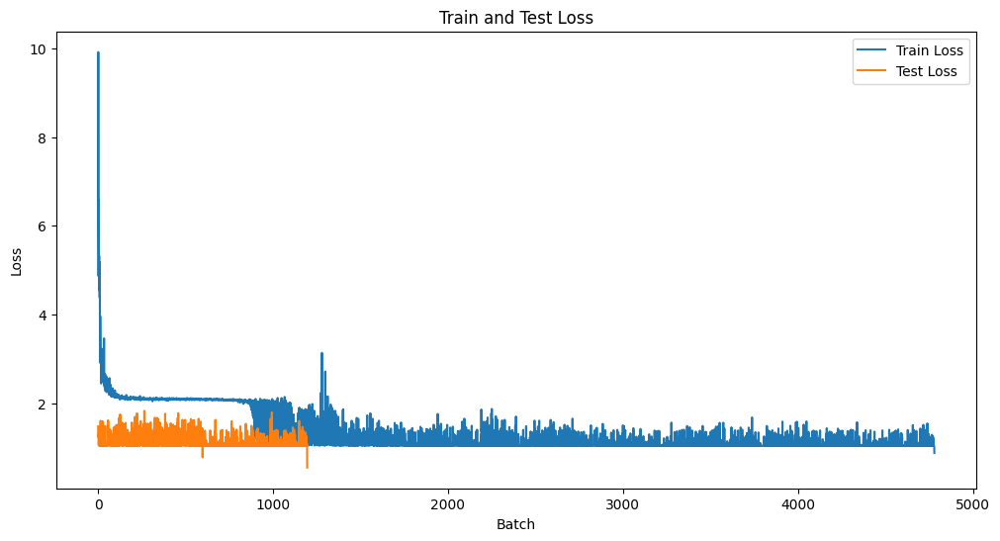

In [ ]:
import torch
from tqdm import tqdm
import matplotlib.pyplot as plt
import itertools
from torch.optim.lr_scheduler import CosineAnnealingLR

def train_epoch(model, train_loader, optimizer, scheduler, device):
    model.train()
    loss_meter = AvgMeter()
    train_losses = []

    tqdm_object = tqdm(train_loader, desc="Training", total=len(train_loader))

    for batch in tqdm_object:
        ecg_batch = batch['ecg'].squeeze(1).to(device)
        text_input_ids_batch = batch['text_input_ids'].to(device)
        text_attention_mask_batch = batch['text_attention_mask'].to(device)
        batch = {
            'image': ecg_batch.unsqueeze(1),
            'input_ids': text_input_ids_batch,
            'attention_mask': text_attention_mask_batch
        }
        optimizer.zero_grad()
        loss = model(batch)
        loss.backward()
        optimizer.step()
        scheduler.step()  # Update the learning rate using the scheduler

        count = batch["image"].size(0)
        loss_meter.update(loss.item(), count)
        train_losses.append(loss.item())

        # Update tqdm with the current loss
        tqdm_object.set_postfix(train_loss=loss_meter.avg)

    return loss_meter.avg, train_losses

def evaluate_model(model, test_loader, device):
    model.eval()
    test_loss_meter = AvgMeter()
    test_losses = []

    tqdm_object = tqdm(test_loader, desc="Evaluating", total=len(test_loader))

    with torch.no_grad():
        for batch in tqdm_object:
            ecg_batch = batch['ecg'].squeeze(1).to(device)
            text_input_ids_batch = batch['text_input_ids'].to(device)
            text_attention_mask_batch = batch['text_attention_mask'].to(device)
            batch = {
                'image': ecg_batch.unsqueeze(1),
                'input_ids': text_input_ids_batch,
                'attention_mask': text_attention_mask_batch
            }
            loss = model(batch)
            count = batch["image"].size(0)
            test_loss_meter.update(loss.item(), count)
            test_losses.append(loss.item())

            # Update tqdm with the current test loss
            tqdm_object.set_postfix(test_loss=test_loss_meter.avg)

    return test_loss_meter.avg, test_losses

# Initialize the model, optimizer, and other parameters
device = "cuda" if torch.cuda.is_available() else "cpu"
#model = CLIPModel().to(device)

params = [
    {"params": model.image_encoder.parameters(), "lr": 1e-4},
    {"params": model.text_encoder.parameters(), "lr": 1e-5},
    {"params": itertools.chain(
        model.image_projection.parameters(), model.text_projection.parameters()
    ), "lr": 1e-3, "weight_decay": 1e-3}
]
optimizer = torch.optim.AdamW(params, weight_decay=0.)

# Create the learning rate scheduler
num_epochs = 2
scheduler = CosineAnnealingLR(optimizer, T_max=len(train_loader) * num_epochs)

train_losses_per_epoch = []
test_losses_per_epoch = []

for epoch in range(num_epochs):
    print(f"Epoch {epoch + 1}/{num_epochs}")

    # Training
    train_loss, train_losses = train_epoch(model, train_loader, optimizer, scheduler, device)
    train_losses_per_epoch.append(train_losses)

    # Evaluation
    test_loss, test_losses = evaluate_model(model, test_loader, device)
    test_losses_per_epoch.append(test_losses)

    print(f"Train Loss: {train_loss:.4f}, Test Loss: {test_loss:.4f}")

# Plot the loss
plt.figure(figsize=(12, 6))

# Flatten lists of losses for plotting
train_losses_flat = [loss for epoch_losses in train_losses_per_epoch for loss in epoch_losses]
test_losses_flat = [loss for epoch_losses in test_losses_per_epoch for loss in epoch_losses]

plt.plot(train_losses_flat, label='Train Loss')
plt.plot(test_losses_flat, label='Test Loss')
plt.xlabel('Batch')
plt.ylabel('Loss')
plt.title('Train and Test Loss')
plt.legend()
plt.show()


In [ ]:
del train_data

In [ ]:
valid_image_embeddings = []
questions = []

model.eval()
with torch.no_grad():
    for batch in tqdm(test_loader, total=len(test_loader)):
        ecg_batch = batch['ecg'].squeeze(1).to(device)
        text_input_ids_batch = batch['text_input_ids'].to(device)
        text_attention_mask_batch = batch['text_attention_mask'].to(device)
        question_batch = batch['original_question']

        batch = {
            'image': ecg_batch.unsqueeze(1),
            'input_ids': text_input_ids_batch,
            'attention_mask': text_attention_mask_batch
        }

        image_features = model.image_encoder(batch["image"])
        image_embeddings = model.image_projection(image_features)
        valid_image_embeddings.append(image_embeddings)
        questions.extend(question_batch)


100%|██████████| 598/598 [00:02<00:00, 240.11it/s]


In [ ]:
question[1]

"Are there any indications of q waves present in lead aVL on this ECG reading? Answer: ['no']"

In [ ]:
image_embeddings = torch.cat(valid_image_embeddings)

In [ ]:
image_embeddings.shape

torch.Size([4759, 128])

In [ ]:
import torch
import torch.nn.functional as F

def pad_tensors(tensors, max_size):
    """
    Pads a list of tensors to a uniform size.

    Args:
        tensors (list of torch.Tensor): List of tensors to pad.
        max_size (tuple): The target size for padding.

    Returns:
        torch.Tensor: A tensor of shape (num_tensors, *max_size).
    """
    padded_tensors = []
    for tensor in tensors:
        padding_size = [max_size[i] - tensor.size(i) for i in range(len(max_size))]
        if len(padding_size) == 1:
            # For 1D tensors
            padded_tensor = F.pad(tensor, (0, padding_size[0]), mode='constant', value=0)
        elif len(padding_size) == 2:
            # For 2D tensors
            padded_tensor = F.pad(tensor, (0, padding_size[1], 0, padding_size[0]), mode='constant', value=0)
        else:
            raise ValueError("Unsupported tensor dimensions")
        padded_tensors.append(padded_tensor)

    return torch.stack(padded_tensors)

# Example usage
def prepare_embeddings(embeddings_list, device):
    # Determine the maximum size
    max_size = [max(tensor.size(0) for tensor in embeddings_list), embeddings_list[0].size(1)]

    # Pad and stack tensors
    return pad_tensors(embeddings_list, max_size).to(device)
import torch.nn.functional as F
import torch.nn.functional as F

def infer_answers(model, valid_image_embeddings, test_loader, question_answer_dict, n=9):
    tokenizer = DistilBertTokenizer.from_pretrained("distilbert-base-uncased")
    results = []

    # Prepare embeddings with padding
    valid_image_embeddings = prepare_embeddings(valid_image_embeddings, device)

    for question, possible_answers in question_answer_dict.items():
        possible_answers_list = list(possible_answers)  # Convert set to list

        # Encode all possible answers
        encoded_answers = tokenizer(possible_answers_list, padding=True, truncation=True, return_tensors="pt", max_length=128)

        # Move tensors to the appropriate device
        encoded_answers = {key: value.to(device) for key, value in encoded_answers.items()}

        with torch.no_grad():
            text_features = model.text_encoder(
                input_ids=encoded_answers["input_ids"], attention_mask=encoded_answers["attention_mask"]
            )
            text_embeddings = model.text_projection(text_features)

        # Normalize embeddings
        image_embeddings = F.normalize(valid_image_embeddings, p=2, dim=-1)
        text_embeddings = F.normalize(text_embeddings, p=2, dim=-1)

        # Ensure the tensors have the correct shape for matrix multiplication
        image_embeddings = image_embeddings.view(image_embeddings.size(0), -1)  # Flatten if needed
        text_embeddings = text_embeddings.view(text_embeddings.size(0), -1)  # Flatten if needed

        # Compute similarity
        dot_similarity = text_embeddings @ image_embeddings.T

        # Find the best match
        if dot_similarity.numel() == 0:
            raise ValueError("Dot similarity tensor is empty.")

        # Find the index of the best match
        best_idx = dot_similarity.max(dim=1)[1].cpu().numpy()

        # Get predicted answers
        predicted_answers = [possible_answers_list[idx] for idx in best_idx]

        # Collect results
        results.append({
            'question': question,
            'predicted_answer': predicted_answers,
            'ground_truth_answers': possible_answers_list  # Store all possible answers for reference
        })

    return results


In [ ]:
from sklearn.metrics import accuracy_score

y_true = []  # List of ground truth answers
y_pred = []  # List of predicted answers

for result in results:
    y_true.append(list(result['ground_truth_answers'])[0])  # Assuming the first ground truth as the correct one
    y_pred.append(result['predicted_answer'])

accuracy = accuracy_score(y_true, y_pred)
print(f"Model Accuracy: {accuracy:.4f}")


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torch

# Define lead names and other constants
lead_names = ["I", "II", "III", "aVR", "aVL", "aVF", "V1", "V2", "V3", "V4", "V5", "V6"]
hz = 500
start_time = 0
time = 10
start_length = int(start_time * hz)
sample_length = int(time * hz)
end_time = start_time + time
t = np.arange(start_time, end_time, 1 / hz)

def plot_lead(ax, ecg, lead, start_length, sample_length, t, lead_name):
    if isinstance(ecg, torch.Tensor):
        ecg = ecg.numpy()  # Convert PyTorch tensor to NumPy array

    ax.plot(
        t,
        ecg[lead, start_length: start_length + sample_length],
        linewidth=2,
        color="k",
        alpha=1.0,
        label=lead_name
    )

    minimum = np.min(ecg[lead])
    maximum = np.max(ecg[lead])
    ylims_candidates = [-2.5, -2.0, -1.5, -1.0, -0.5, 0, 0.5, 1.0 , 1.5, 2.0, 2.5]

    # Find the closest values in ylims_candidates to the actual minimum and maximum
    ylims_lower = max([x for x in ylims_candidates if x <= minimum], default=ylims_candidates[0])
    ylims_upper = min([x for x in ylims_candidates if x >= maximum], default=ylims_candidates[-1])

    ax.vlines(np.arange(start_time, end_time, 0.2), ylims_lower, ylims_upper, colors="r", alpha=1.0)
    ax.vlines(np.arange(start_time, end_time, 0.04), ylims_lower, ylims_upper, colors="r", alpha=0.3)
    ax.hlines(np.arange(ylims_lower, ylims_upper, 0.5), start_time, end_time, colors="r", alpha=1.0)
    ax.hlines(np.arange(ylims_lower, ylims_upper, 0.1), start_time, end_time, colors="r", alpha=0.3)

    ax.set_xticks(np.arange(start_time, end_time + 1, 1.0))
    ax.set_ylim([ylims_lower, ylims_upper])
    ax.margins(0.0)
    ax.legend(loc="upper right")

def draw_12_lead_ecg(ecg):
    plt.rcParams["figure.figsize"] = (25, 1.5 * len(lead_names))
    fig, axes = plt.subplots(len(lead_names), 1, sharex=True, figsize=(25, 1.5 * len(lead_names)))

    for i, lead in enumerate(range(len(lead_names))):
        plot_lead(axes[i], ecg, lead, start_length, sample_length, t, lead_names[lead])

    plt.tight_layout()
    plt.show()



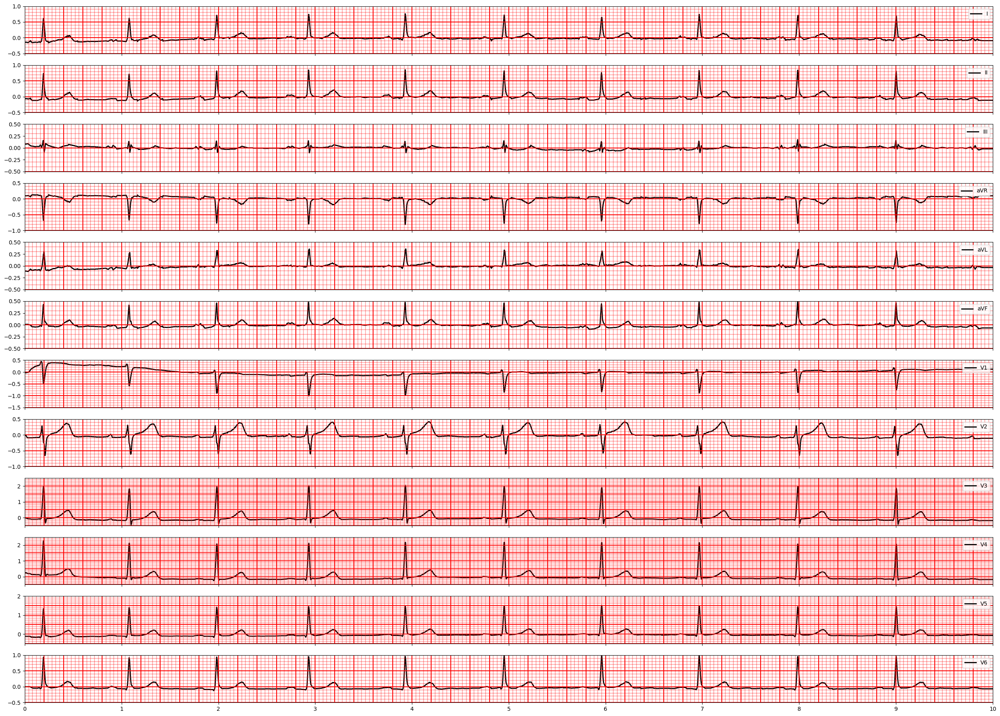

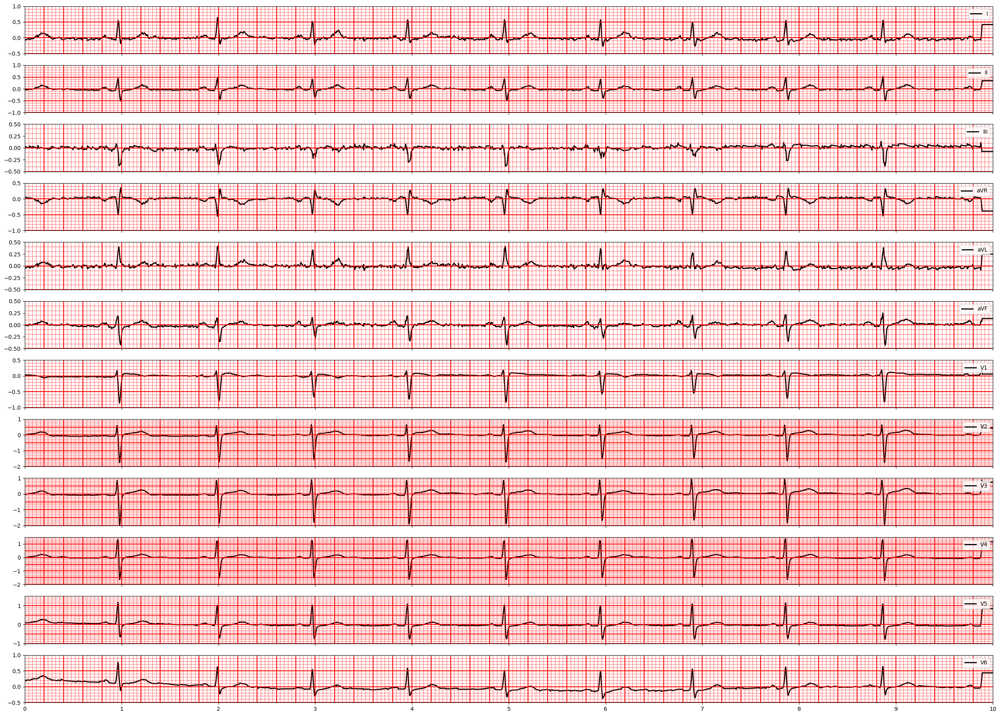

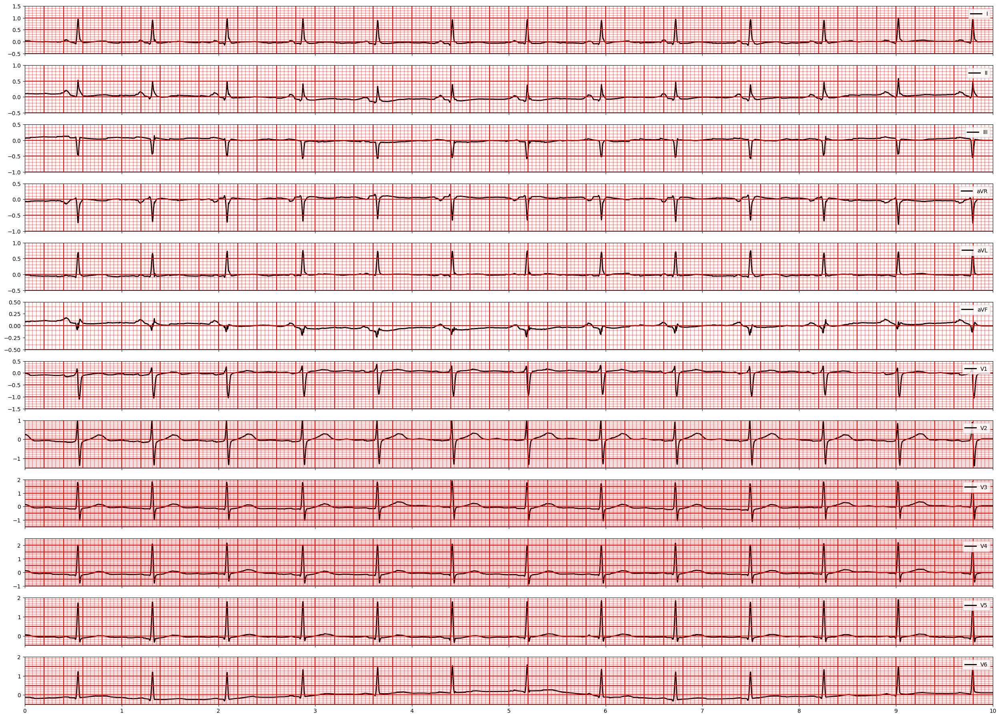

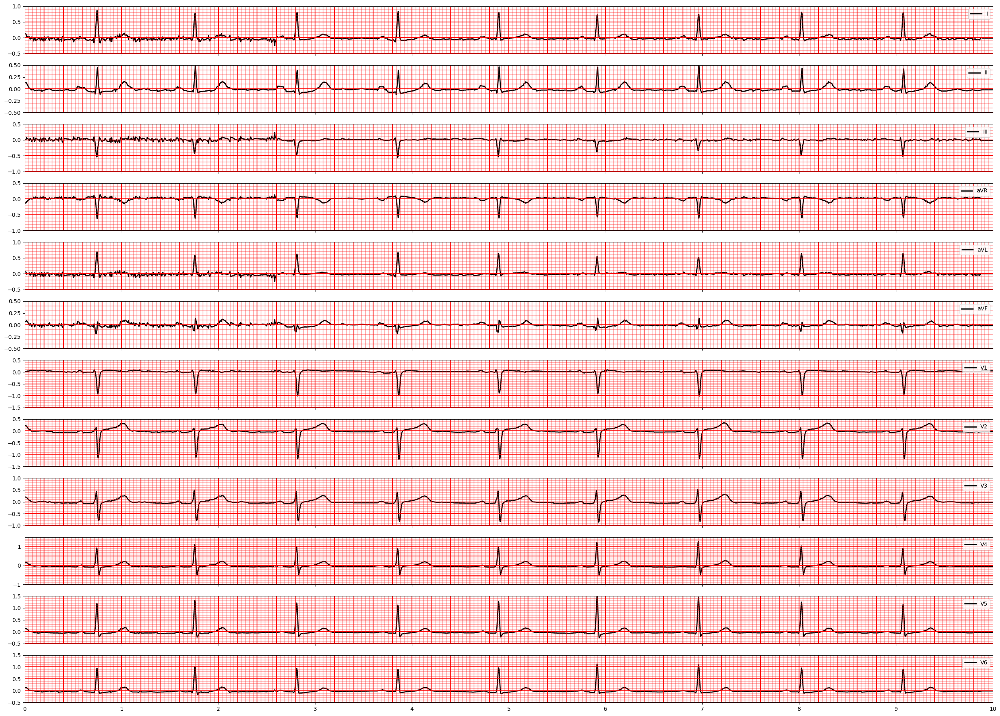

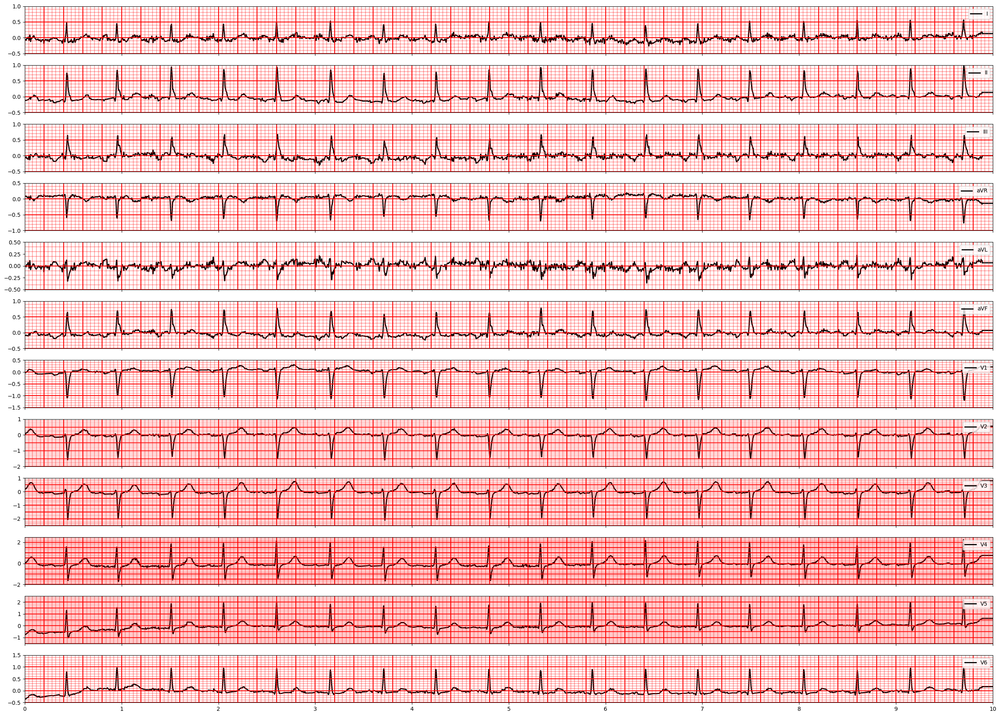

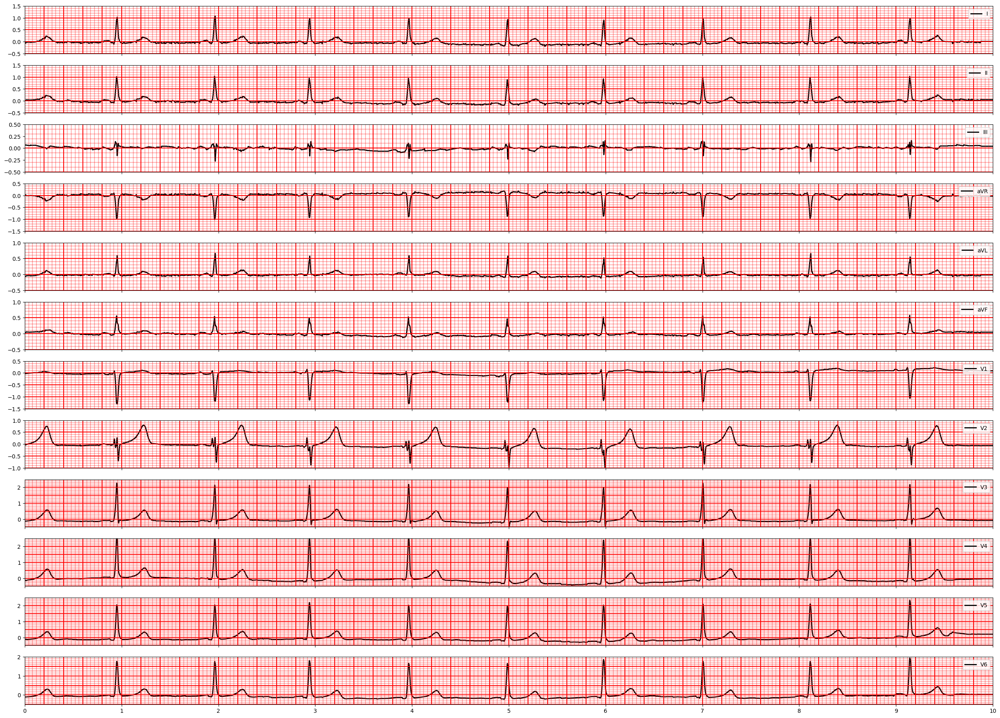

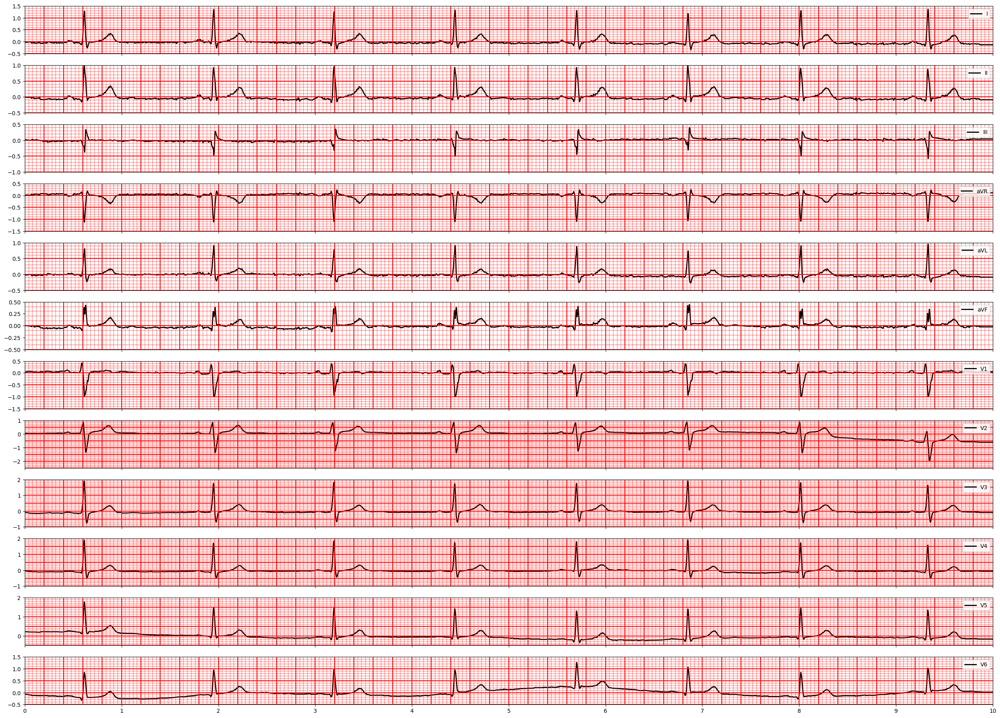

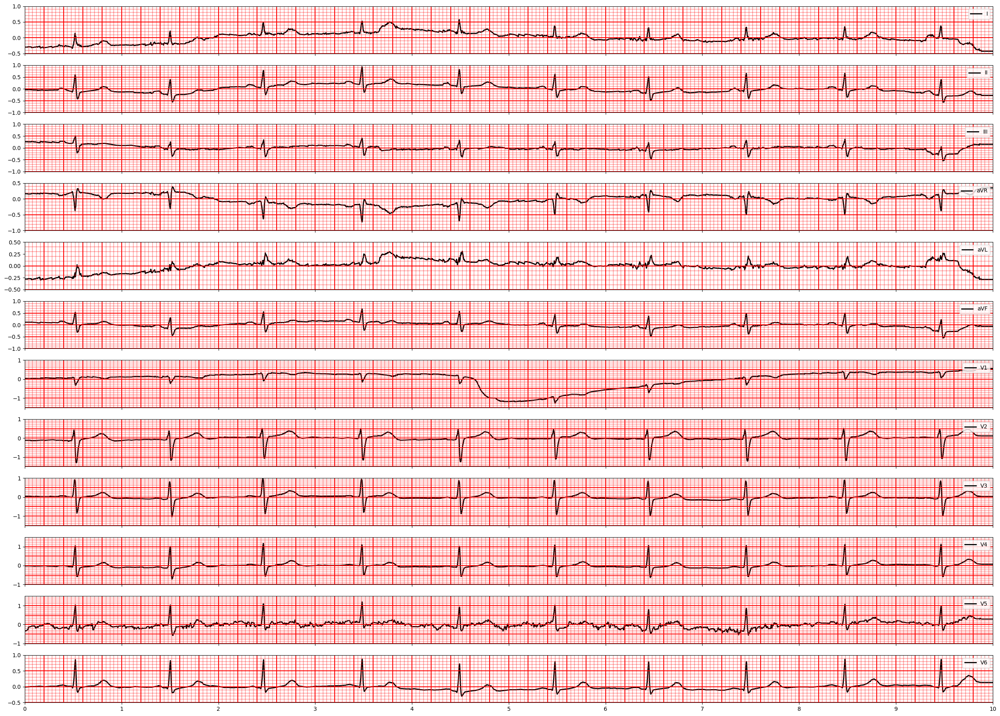

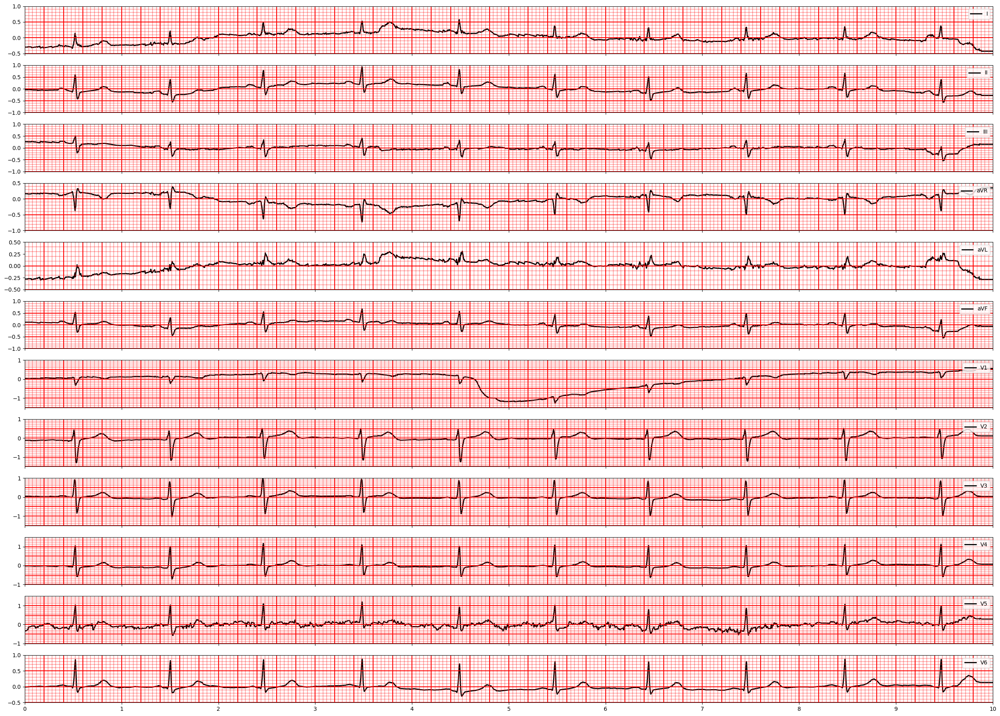

In [ ]:
for i in indices:
    ecg = test_data[i]['ecg'].squeeze(0)
    #print(ecg.shape)
    draw_12_lead_ecg(ecg)

In [ ]:
!pip install wfdb

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 160.0/160.0 kB 10.1 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
import wfdb
import ast

def load_raw_data(df, sampling_rate, path):
    if sampling_rate == 100:
        data = [wfdb.rdsamp(path+f) for f in df.filename_lr]
    else:
        data = [wfdb.rdsamp(path+f) for f in df.filename_hr]
    data = np.array([signal for signal, meta in data])
    return data

path = '/content/data/ptb-xl-a-large-publicly-available-electrocardiography-dataset-1.0.3/'
sampling_rate=100

# load and convert annotation data
Y = pd.read_csv(path+'ptbxl_database.csv', index_col='ecg_id')
Y.scp_codes = Y.scp_codes.apply(lambda x: ast.literal_eval(x))

# Load raw signal data
X = load_raw_data(Y, sampling_rate, path)

# Load scp_statements.csv for diagnostic aggregation
agg_df = pd.read_csv(path+'scp_statements.csv', index_col=0)
agg_df = agg_df[agg_df.diagnostic == 1]

def aggregate_diagnostic(y_dic):
    tmp = []
    for key in y_dic.keys():
        if key in agg_df.index:
            tmp.append(agg_df.loc[key].diagnostic_class)
    return list(set(tmp))

# Apply diagnostic superclass
Y['diagnostic_superclass'] = Y.scp_codes.apply(aggregate_diagnostic)

# Split data into train and test
test_fold = 10
# Train
X_train = X[np.where(Y.strat_fold != test_fold)]
y_train = Y[(Y.strat_fold != test_fold)].diagnostic_superclass
# Test
X_test = X[np.where(Y.strat_fold == test_fold)]
y_test = Y[Y.strat_fold == test_fold].diagnostic_superclass

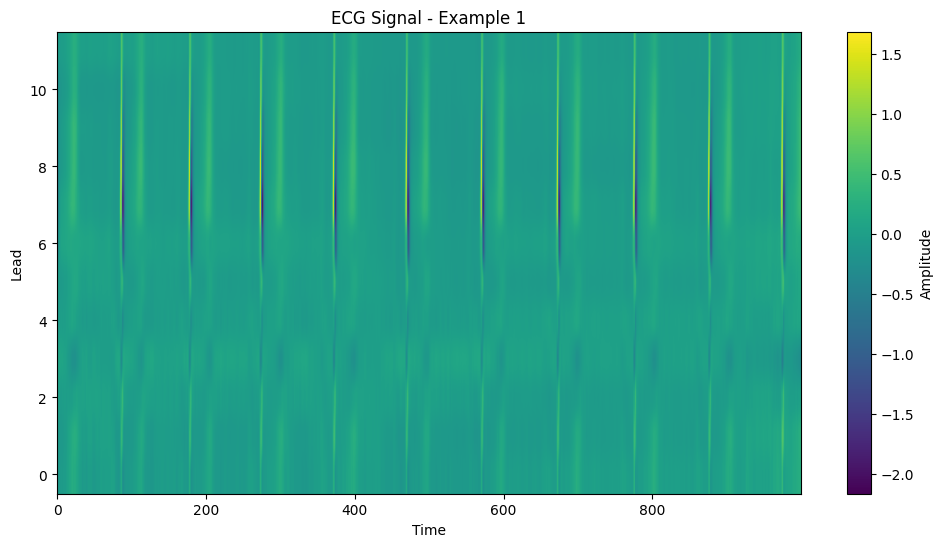

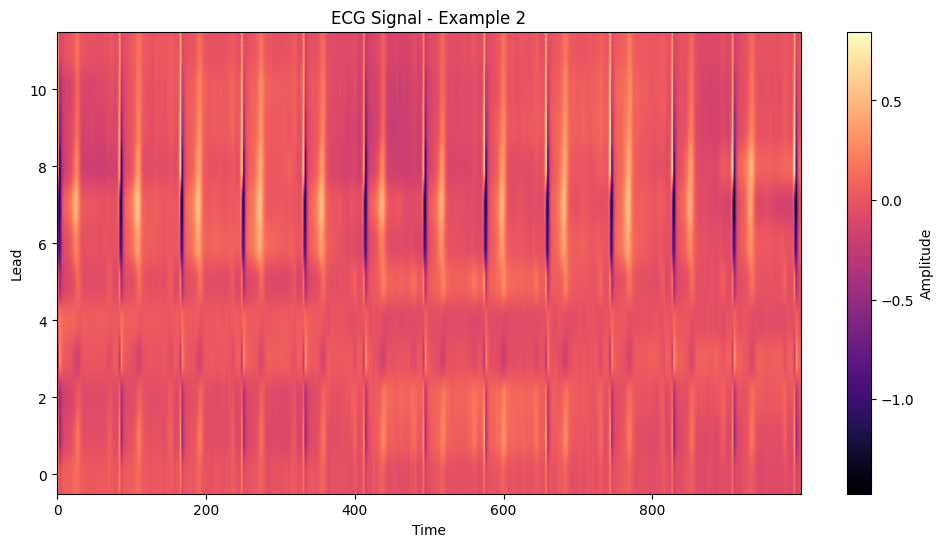

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_ecg_as_image(signal, title="ECG Signal", colormap='viridis'):
    """
    Plots ECG signal as an image with time on the x-axis and leads on the y-axis.

    Parameters:
        signal: 2D numpy array of shape (time_points, num_leads)
        title: Title of the plot
        colormap: Color map to use for the image
    """
    plt.figure(figsize=(12, 6))
    plt.imshow(signal.T, aspect='auto', cmap=colormap, origin='lower')
    plt.colorbar(label='Amplitude')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Lead')
    plt.show()

# Plot the first ECG signal in the test set with a color map
plot_ecg_as_image(X_test[0], title="ECG Signal - Example 1", colormap='viridis')

# Plot another ECG signal with a different color map
plot_ecg_as_image(X_test[1], title="ECG Signal - Example 2", colormap='magma')


In [ ]:
from sklearn.preprocessing import MultiLabelBinarizer
from torch.utils.data import DataLoader, TensorDataset

def prepare_data(X, y, mlb=None):
    X = torch.tensor(X, dtype=torch.float32)

    # Convert multi-labels to binary matrix
    if mlb is None:
        mlb = MultiLabelBinarizer()
        y = mlb.fit_transform(y)
    else:
        y = mlb.transform(y)

    y = torch.tensor(y, dtype=torch.float32)
    dataset = TensorDataset(X, y)
    return DataLoader(dataset, batch_size=32, shuffle=True), mlb

# Initialize MultiLabelBinarizer
mlb = None

# Prepare train and test loaders
train_loader, mlb = prepare_data(X_train, y_train, mlb)
test_loader, _ = prepare_data(X_test, y_test, mlb)


In [ ]:
y_train.shape

(19601,)

In [ ]:
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

# Define the model, optimizer, and device
model = SimpleViT(image_size=(1000, 12), patch_size=(100, 1), num_classes=len(mlb.classes_), dim=512, depth=3, heads=6, mlp_dim=256, channels=1, dim_head=64)
optimizer = optim.Adam(model.parameters(), lr=3e-4)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# Define the loss function
loss_func = torch.nn.BCELoss()

# Training loop with batch loss printing
def train_epoch(model, train_loader, loss_func, optimizer, device, print_every=10, threshold=0.5):
    model.train()
    total_loss = 0
    correct_predictions = 0
    total_predictions = 0

    for batch_idx, (data, labels) in enumerate(train_loader):
        data = data.to(device)
        data = data.unsqueeze(1)  # Add channel dimension
        labels = labels.to(device)
        #print(labels.shape)

        optimizer.zero_grad()
        outputs = model(data)
        #print(outputs.shape)
        loss = loss_func(outputs, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

        # Apply threshold to outputs
        preds = (outputs > threshold).float()

        # Calculate accuracy
        correct_predictions += (preds == labels).sum().item()
        total_predictions += labels.numel()

        if (batch_idx + 1) % print_every == 0:
            print(f'Batch {batch_idx + 1}/{len(train_loader)}, Loss: {loss.item():.4f}, Accuracy: {correct_predictions / total_predictions:.4f}')

    avg_loss = total_loss / len(train_loader)
    accuracy = correct_predictions / total_predictions
    return avg_loss, accuracy



# Validation loop with batch loss printing
def validate_epoch(model, val_loader, loss_func, device, print_every=10, threshold=0.5):
    model.eval()
    total_loss = 0
    correct_predictions = 0
    total_predictions = 0

    with torch.no_grad():
        for batch_idx, (data, labels) in enumerate(val_loader):
            data = data.to(device)
            data = data.unsqueeze(1)  # Add channel dimension
            labels = labels.to(device)
            outputs = model(data)
            loss = loss_func(outputs, labels)
            total_loss += loss.item()

            # Apply threshold to outputs

            preds = (outputs > threshold).float()
            #print(f'preds = {preds}', labels)
            # Calculate accuracy
            correct_predictions += (preds == labels).sum().item()
            total_predictions += labels.numel()

            if (batch_idx + 1) % print_every == 0:
                print(f'Validation Batch {batch_idx + 1}/{len(val_loader)}, Loss: {loss.item():.4f}')

    avg_loss = total_loss / len(val_loader)
    accuracy = correct_predictions / total_predictions
    return avg_loss, accuracy

num_epochs = 50
print_every = 10

for epoch in range(num_epochs):
    print(f'Epoch {epoch + 1}/{num_epochs}')
    train_loss, train_accuracy = train_epoch(model, train_loader, loss_func, optimizer, device, print_every)
    val_loss, val_accuracy = validate_epoch(model, test_loader, loss_func, device, print_every)
    print(f'Epoch {epoch + 1}, Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}, Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')



Epoch 1/50
Batch 10/613, Loss: 0.5491, Accuracy: 0.6963
Batch 20/613, Loss: 0.5250, Accuracy: 0.7169
Batch 30/613, Loss: 0.5575, Accuracy: 0.7260
Batch 40/613, Loss: 0.5335, Accuracy: 0.7334
Batch 50/613, Loss: 0.5587, Accuracy: 0.7369
Batch 60/613, Loss: 0.4867, Accuracy: 0.7385
Batch 70/613, Loss: 0.4930, Accuracy: 0.7422
Batch 80/613, Loss: 0.4898, Accuracy: 0.7468
Batch 90/613, Loss: 0.4939, Accuracy: 0.7521
Batch 100/613, Loss: 0.5536, Accuracy: 0.7549
Batch 110/613, Loss: 0.6251, Accuracy: 0.7570
Batch 120/613, Loss: 0.5531, Accuracy: 0.7577
Batch 130/613, Loss: 0.4843, Accuracy: 0.7594
Batch 140/613, Loss: 0.4833, Accuracy: 0.7614
Batch 150/613, Loss: 0.4054, Accuracy: 0.7629
Batch 160/613, Loss: 0.5152, Accuracy: 0.7654
Batch 170/613, Loss: 0.4679, Accuracy: 0.7662
Batch 180/613, Loss: 0.4808, Accuracy: 0.7688
Batch 190/613, Loss: 0.3401, Accuracy: 0.7698
Batch 200/613, Loss: 0.4967, Accuracy: 0.7709
Batch 210/613, Loss: 0.4439, Accuracy: 0.7732
Batch 220/613, Loss: 0.5541, Acc

In [ ]:
    images = torch.randn(8, 1, 440, 128)
    input_ids = torch.randint(5, 300, size=(8, 25))
    attention_mask = torch.ones(8, 25)
    batch = {
        'image': images,
        'input_ids': input_ids,
        'attention_mask': attention_mask
    }

    CLIP = CLIPModel(image_encoder=model)
    loss = CLIP(batch)
    print(loss)